# **MIT 6.S085 Machine Learning for Molecular Design**

## Lecture 4: Structure-property relationship modeling (Part 2): deep learning architectures!

*   We will start at 10:05 am

Lecturer: Wenhao Gao

Date: 2024/01/17

Note: This notebook introduces the deep learning, and deep learning approaches to structure-property relationship modeling.


# **Outline**

1. Review -- machine learning
2. Introduction to deep learning -- what and why
3. Predictive modeling based on SMILES representation
4. Predictive modeling based on graph representation
5. Practice

In [ ]:
!pip install rdkit pytorch-ignite PyTDC pandas-flavor chemprop torch_geometric wget
!pip install git+https://github.com/bp-kelley/descriptastorus

  Cloning https://github.com/bp-kelley/descriptastorus to /tmp/pip-req-build-63ztnqyb
  Running command git clone --filter=blob:none --quiet https://github.com/bp-kelley/descriptastorus /tmp/pip-req-build-63ztnqyb
  Resolved https://github.com/bp-kelley/descriptastorus to commit da9760932ab9a78b116bc697795dd9e1798f087a
  Preparing metadata (setup.py) ... done


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import rdkit
from rdkit import Chem, RDLogger
import tabulate
import itertools
from typing import List, Tuple, Union
import wget
wget.download('https://raw.githubusercontent.com/wenhao-gao/24IAP_ml4moldesign/main/P3/utils.py')
import utils
from IPython.core.display import display, HTML, Image

from tdc.chem_utils import MolConvert
smi2morgan = MolConvert(src = 'SMILES', dst = 'Morgan')
smi2rdkit2d = MolConvert(src = 'SMILES', dst = 'RDKit2D')

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

import torch
from torch.utils import data
from torch import nn
from torch.nn import functional as F

from torch_geometric.data import Data
from torch_geometric.nn import MLP, GINConv, global_add_pool

In [ ]:
print(f"PyTorch: {torch.__version__}")
print(f"RDKit: {rdkit.__version__}")
print('__CUDNN VERSION:', torch.backends.cudnn.version())
print('__Number CUDA Devices:', torch.cuda.device_count())
print('__CUDA Device Name:',torch.cuda.get_device_name(0))
print('__CUDA Device Total Memory [GB]:',torch.cuda.get_device_properties(0).total_memory/1e9)

PyTorch: 2.1.0+cu121
RDKit: 2023.09.4
__CUDNN VERSION: 8902
__Number CUDA Devices: 0


RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

# **Review -- machine learning**

Machine learning is an algorithmic approach to learn a mapping from a set of features (input) to a prediction target (output) from data. Is requires:


*   Define a function space (SVM, Decision tree, Neural networks, etc)
*   Define a "distance" between functions (L2, L1, cross entropy, etc)
*   An algorithm to search for the optimal function form (gradient descent, etc)

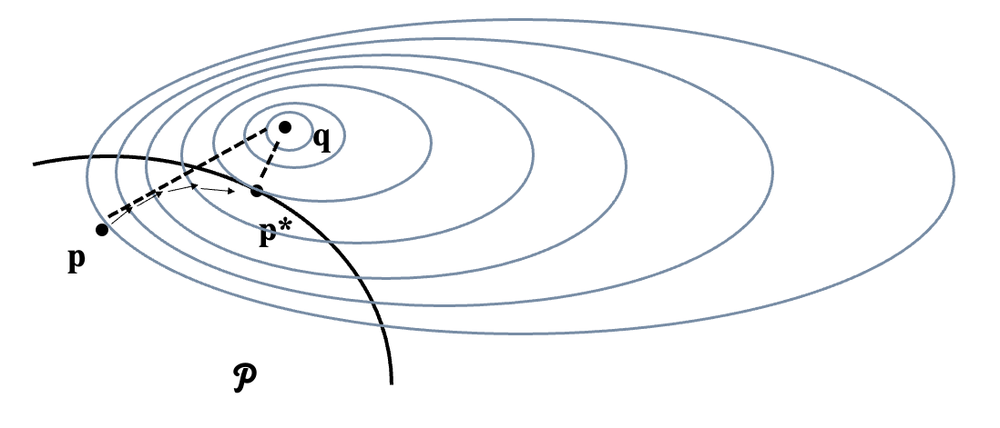

In [ ]:
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/ML.jpg?raw=true'), width=1000)

Let's see an example of solubility prediction, [AqSolDB](https://tdcommons.ai/single_pred_tasks/adme/#solubility-aqsoldb):

In [ ]:
from tdc.single_pred import ADME
data = ADME(name = 'Solubility_AqSolDB')
split = data.get_split(method='random', seed=42, frac=[0.8, 0., 0.2])
data_train, data_test = split['train'], split['test']
data_all = data.get_data()

Found local copy...
Loading...
Done!


In [ ]:
data_train

,Drug_ID,Drug,Y
0,Benzo[cd]indol-2(1H)-one,O=C1Nc2cccc3cccc1c23,-3.254767
1,4-chlorobenzaldehyde,O=Cc1ccc(Cl)cc1,-2.177078
2,4-({4-[bis(oxiran-2-ylmethyl)amino]phenyl}meth...,c1cc(N(CC2CO2)CC2CO2)ccc1Cc1ccc(N(CC2CO2)CC2CO...,-4.662065
3,vinyltoluene,C=Cc1cccc(C)c1,-3.123150
4,3-(3-ethylcyclopentyl)propanoic acid,CCC1CCC(CCC(=O)O)C1,-3.286116
...,...,...,...
7981,sulfamethazine,Cc1cc(C)nc(NS(=O)(=O)c2ccc(N)cc2)n1,-2.730000
7982,sulindac_form_II,CC1=C(CC(=O)O)c2cc(F)ccc2/C1=C/c1ccc(S(C)=O)cc1,-4.500000
7983,tetracaine,CCCCNc1ccc(C(=O)OCCN(C)C)cc1,-3.010000
7984,thymol,Cc1ccc(C(C)C)c(O)c1,-2.190000


In [ ]:
data_test

,Drug_ID,Drug,Y
0,"2-ethyl-9,10-dihydroanthracene-9,10-dione",CCc1ccc2c(c1)C(=O)c1ccccc1C2=O,-5.984242
1,Digoxin,CC1OC(OC2C(O)CC(OC3C(O)CC(OC4CCC5(C)C(CCC6C5CC...,-4.160000
2,diphenic acid,O=C(O)c1ccccc1-c1ccccc1C(=O)O,-2.283900
3,pentachlorobutadiene,ClC(Cl)=CC(Cl)=C(Cl)Cl,-4.230000
4,trimethyl phosphate,COP(=O)(OC)OC,0.552600
...,...,...,...
1991,4-vinylpyridine,C=Cc1ccncc1,-0.557900
1992,"Benzoic acid, 2-hydroxy-5-[[4-[[4-[[8-hydroxy-...",COc1cc(N=Nc2cc(S(=O)(=O)[O-])cc3cc(S(=O)(=O)[O...,-2.483388
1993,"(2E)-1-(2,6,6-trimethylcyclohex-3-en-1-yl)but-...",C/C=C/C(=O)C1C(C)C=CCC1(C)C,-3.396367
1994,1-bromo-2-ethylbenzene,CCc1ccccc1Br,-3.670200


In [ ]:
data_train[data_train['Y'] < -11]

,Drug_ID,Drug,Y
1078,copper(2+) ion bis((9Z)-octadec-9-enoate),CCCCCCCC/C=C\CCCCCCCC(=O)[O-].CCCCCCCC/C=C\CCC...,-11.998938
4399,dechlorane plus,ClC1=C(Cl)C2(Cl)C3CCC4C(CCC3C1(Cl)C2(Cl)Cl)C1(...,-13.171900
4697,heptachlorodibenzo-p-dioxin,Clc1cc2c(c(Cl)c1Cl)Oc1c(Cl)c(Cl)c(Cl)c(Cl)c1O2,-11.479500
4718,octachlorodibenzofuran,Clc1c(Cl)c(Cl)c2c(oc3c(Cl)c(Cl)c(Cl)c(Cl)c32)c1Cl,-11.582700
4912,"dibenzofuran, 1,2,3,4,6,7,8-heptachloro-",Clc1cc2c(oc3c(Cl)c(Cl)c(Cl)c(Cl)c32)c(Cl)c1Cl,-11.481700
5617,"1,2,3,4,6,7,8,9-octachlorodibenzo-p-dioxin",Clc1c(Cl)c(Cl)c2c(c1Cl)Oc1c(Cl)c(Cl)c(Cl)c(Cl)...,-12.060500
7791,"2,2',3,3',4,4',5,5',6,6'-PCB",Clc1c(Cl)c(Cl)c(-c2c(Cl)c(Cl)c(Cl)c(Cl)c2Cl)c(...,-11.600000


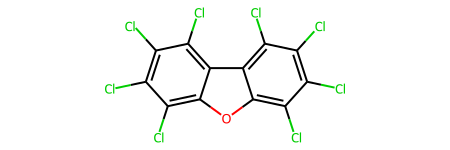

In [ ]:
Chem.MolFromSmiles("Clc1c(Cl)c(Cl)c2c(oc3c(Cl)c(Cl)c(Cl)c(Cl)c32)c1Cl	")

In [ ]:
data_train[data_train['Y'] > 1.5]

,Drug_ID,Drug,Y
678,9-[2-(2-methoxyethoxy)ethoxy]-9-[3-(oxiran-2-y...,COCCOCCO[Si](CCCOCC1CO1)(OCCOCCOC)OCCOCCOC,1.582313
1385,bis(tetrakis(hydroxymethyl)phosphanium) sulfate,O=S(=O)([O-])[O-].OC[P+](CO)(CO)CO.OC[P+](CO)(...,1.967513
1396,hydrazine dihydrochloride,NN.[Cl-].[H+],1.595629
1401,4-methyl-2-(2-methylpropyl)oxan-4-ol,CC(C)CC1CC(C)(O)CCO1,2.137682
1523,dimethyl {3-[(hydroxymethyl)amino]-3-oxopropyl...,COP(=O)(CCC(=O)NCO)OC,1.578491
1542,ammonium bromide,[Br-].[NH4+],1.908300
1689,"hexane-1,6-diol",OCCCCCCO,1.626441
1837,N-methylmethanaminium chloride,CNC.[Cl-].[H+],1.565719
1880,"but-2-yne-1,4-diol",OCC#CCO,1.536339
2001,"2-Hydroxy-N,N-dimethylpropanamide",CC(O)C(=O)N(C)C,1.630235


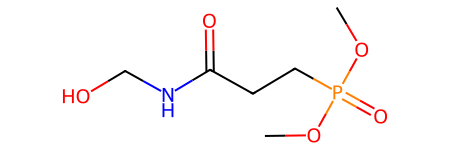

In [ ]:
Chem.MolFromSmiles("COP(=O)(CCC(=O)NCO)OC")

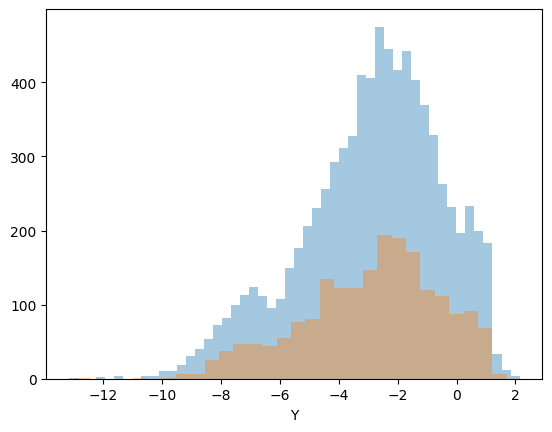

In [ ]:
sns.distplot(data_train['Y'], kde=False, rug=False)
sns.distplot(data_test['Y'], kde=False, rug=False)
plt.show()

In [ ]:
X_fp_train = smi2morgan(data_train['Drug'].to_list())
X_fp_test = smi2morgan(data_test['Drug'].to_list())

y_train = data_train['Y'].to_numpy()
y_test = data_test['Y'].to_numpy()

[15:17:31] WARNING: not removing hydrogen atom without neighbors
[15:17:31] WARNING: not removing hydrogen atom without neighbors
[15:17:31] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not removing hydrogen atom without neighbors
[15:17:32] WARNING: not r

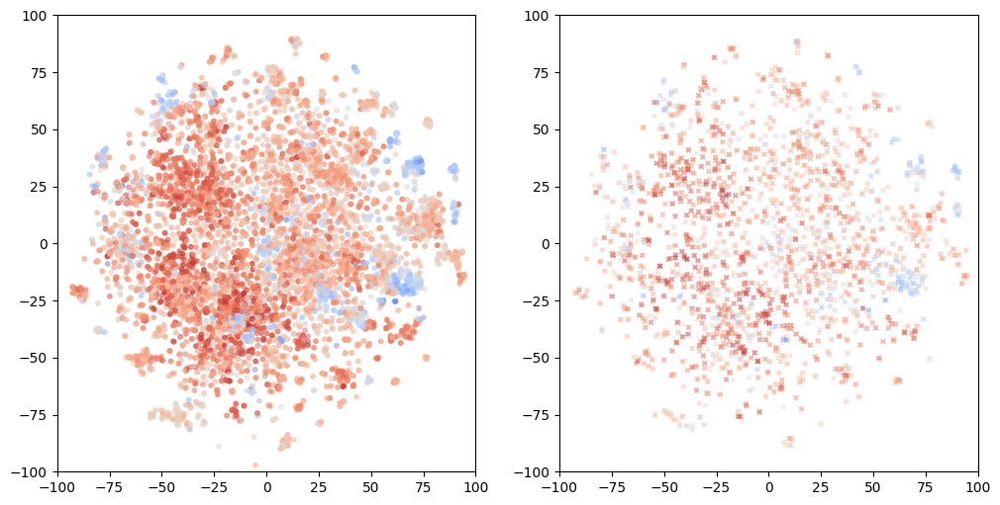

In [ ]:
# tsne visualization with coloring

# from sklearn.manifold import TSNE
# tsne = TSNE(n_components=2, random_state=42)
# X_tsne = tsne.fit_transform(np.concatenate([X_fp_train, X_fp_test], axis=0))
wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/raw/main/P3/X_tsne.npy')
X_tsne = np.load("X_tsne.npy")

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X_tsne[:X_fp_train.shape[0], 0], X_tsne[:X_fp_train.shape[0], 1], c=y_train, cmap='coolwarm', alpha=0.5, label='train', s=10)
plt.xlim([-100, 100])
plt.ylim([-100, 100])
plt.subplot(1, 2, 2)
plt.scatter(X_tsne[X_fp_train.shape[0]:, 0], X_tsne[X_fp_train.shape[0]:, 1], c=y_test, cmap='coolwarm', alpha=0.5, label='test', s=10, marker='x')
plt.xlim([-100, 100])
plt.ylim([-100, 100])
plt.show()

MAE: 1.436
R^2: 0.389


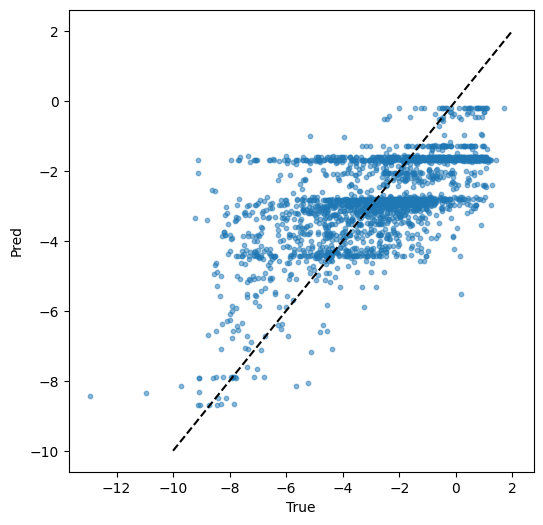

In [ ]:
rf = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
rf.fit(X_fp_train, y_train)

y_pred = rf.predict(X_fp_test)

mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print('MAE: %.3f' % mae)
print('R^2: %.3f' % r2)

# plot
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=10, alpha=0.5)
plt.plot([-10, 2], [-10, 2], 'k--')
plt.xlabel('True')
plt.ylabel('Pred')
plt.show()

Representation is important, let's change to another set of feature:

In [ ]:
# Takes about 3.5 min
# X_desc_train = smi2rdkit2d(data_train['Drug'].to_list())
# X_desc_test = smi2rdkit2d(data_test['Drug'].to_list())
wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/raw/main/P3/X_desc_train.npy')
wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/raw/main/P3/X_desc_test.npy')
X_desc_train = np.load("./X_desc_train.npy")
X_desc_test = np.load("./X_desc_test.npy")

In [ ]:
X_desc_train.shape

(7986, 200)

MAE: 0.908
R^2: 0.724


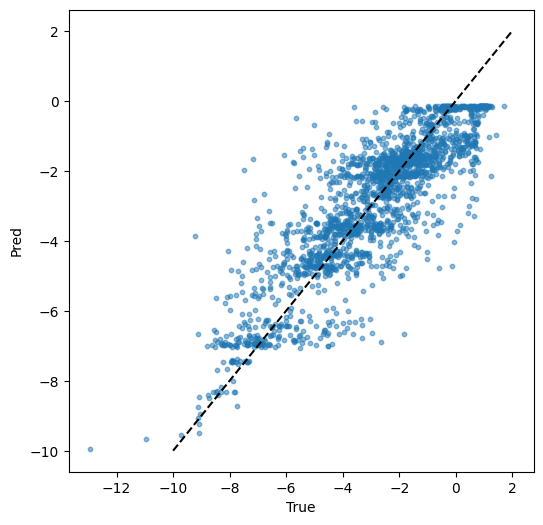

In [ ]:
rf = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
rf.fit(X_desc_train, y_train)

y_pred = rf.predict(X_desc_test)

mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print('MAE: %.3f' % mae)
print('R^2: %.3f' % r2)

# plot
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=10, alpha=0.5)
plt.plot([-10, 2], [-10, 2], 'k--')
plt.xlabel('True')
plt.ylabel('Pred')
plt.show()

# **Introduction to deep learning -- what and why (from classical ML perspective)**

First a reminder that what a neural network is:

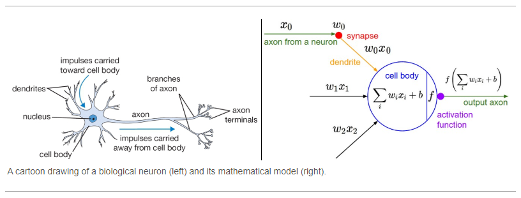

In [ ]:
# Source: cs231n by Stanford
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/neurons.png?raw=true'), width=800)

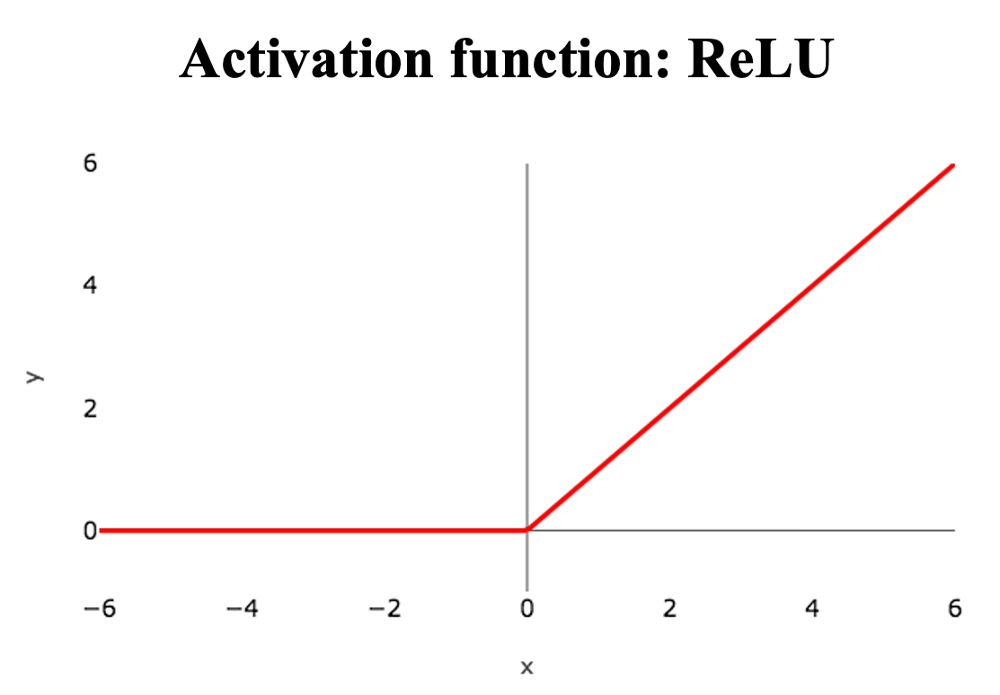

In [ ]:
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/relu.png?raw=true'), width=500)

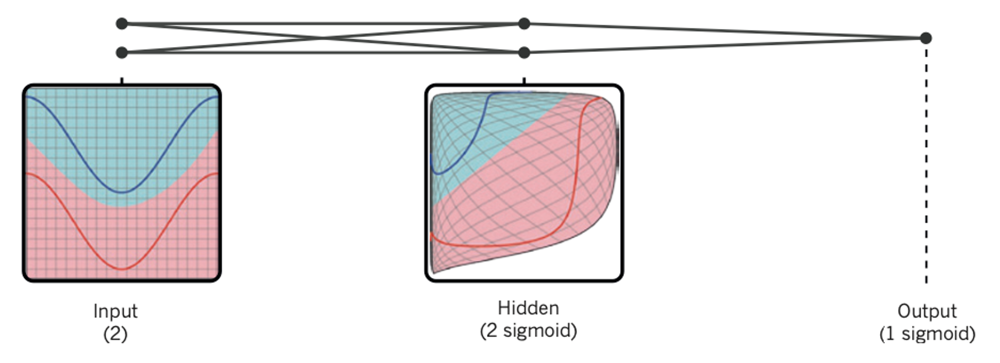

In [ ]:
# Source: LeCun, Y., Bengio, Y., & Hinton, G. (2015). Deep learning. nature, 521(7553), 436-444.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/neural_network.png?raw=true'), width=750)

Deep learning is machine learning that involves deep (mutli-layer) neural networks as the main workhoarse.

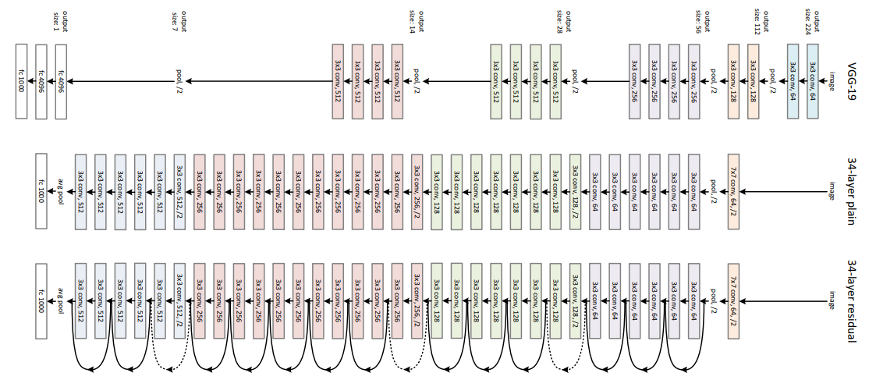

In [ ]:
# Source: He, K., Zhang, X., Ren, S., & Sun, J. (2016). In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 770-778).
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/dnn.png?raw=true'), width=1000)

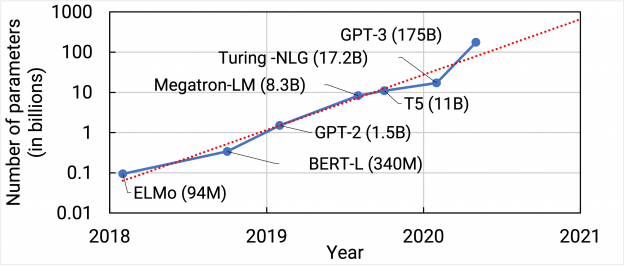

In [ ]:
# Source: https://developer.nvidia.com/blog/scaling-language-model-training-to-a-trillion-parameters-using-megatron/
Image(filename=wget.download('https://developer-blogs.nvidia.com/wp-content/uploads/2021/03/NLP_model_size-1-625x266.png'), width=600)

## PyTorch

In [ ]:
import torch

x = torch.tensor([0.0, 1.0, 2.0])
y = torch.tensor([3.0, 4.0, 5.0])
x, y

(tensor([0., 1., 2.]), tensor([3., 4., 5.]))

In [ ]:
# Operations
x + y, x - y, x * y, x / y, x @ y

(tensor([3., 5., 7.]),
 tensor([-3., -3., -3.]),
 tensor([ 0.,  4., 10.]),
 tensor([0.0000, 0.2500, 0.4000]),
 tensor(14.))

In [ ]:
# Operations are faster with named function
torch.add(x, y), torch.mul(x, y)

(tensor([3., 5., 7.]), tensor([ 0.,  4., 10.]))

In [ ]:
# Tensor
X = torch.tensor([[0, 1, 2], [1, 2, 3]])
X, X.shape

(tensor([[0, 1, 2],
         [1, 2, 3]]),
 torch.Size([2, 3]))

In [ ]:
# Perform matrix multiplication
Y = torch.tensor([[1, 2], [3, 4], [5, 6]])
torch.mm(X, Y)

tensor([[13, 16],
        [22, 28]])

In [ ]:
class Net(torch.nn.Module):
    def __init__(self, input_dim=1, output_dim=1, hidden_dims=[8]):
        super().__init__()
        layers = []
        self.input_dim = input_dim
        self.output_dim = output_dim
        dim = input_dim
        for hdim in hidden_dims:
            layer = torch.nn.Linear(dim, hdim)
            layers.append(layer)
            layers.append(torch.nn.ReLU())
            dim = hdim
        # we had an output layer to map our predictions into the output dimension
        layers.append(torch.nn.Linear(hdim, output_dim))
        self.layers = torch.nn.Sequential(*layers)

    def forward(self, x):
        return self.layers(x)

In [ ]:
model = Net(input_dim=200, hidden_dims=[16])
loss_fn = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), 1e-2)

X = torch.tensor(X_desc_train, dtype=torch.float)
y = torch.tensor(y_train, dtype=torch.float).reshape(X.shape[0], 1)

y

tensor([[-3.2548],
        [-2.1771],
        [-4.6621],
        ...,
        [-3.0100],
        [-2.1900],
        [-4.7800]])

In [ ]:
def train(x, y, model, loss_fn, optimizer, num_epochs=100):
    losses = []
    for epoch in range(num_epochs):
        loss, y_hat = run_epoch(x, y, model, optimizer, loss_fn)
        losses.append(loss)
    y_hat = model(x)
    return losses, y_hat.detach()

def run_epoch(x, y, model, optimizer, loss_fn):
    optimizer.zero_grad()
    y_hat = model(x)
    loss = loss_fn(y, y_hat)
    loss.backward()
    # we log the loss values
    optimizer.step()
    return loss.item(), y_hat.detach()

losses, y_hat = train(X, y, model,
                              loss_fn,
                              optimizer,
                              num_epochs=200)

Text(0, 0.5, 'error')

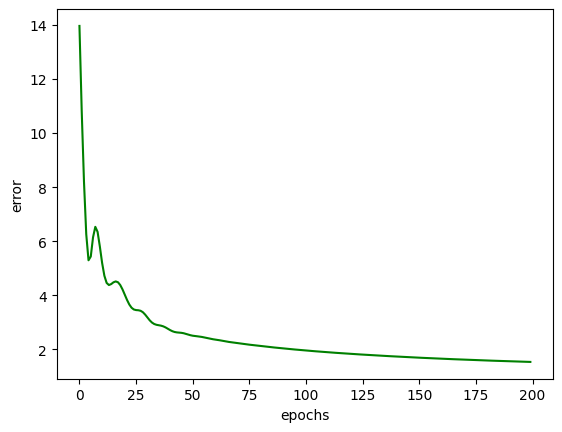

In [ ]:
# Plotting the loss
plt.plot(losses, color="green")
plt.xlabel("epochs")
plt.ylabel("error")

## Why Deep: Stronger expressive power

* Please note that the following explanations are not rigorous but are meant to offer an intuitive understanding. For a more detailed and rigorous derivation, refer to the original paper.

Hornik (1989) proved NNs with one hidden layer are universal approximators

Hornik, K., Stinchcombe, M., & White, H. (1989). Neural networks, 2(5), 359-366.

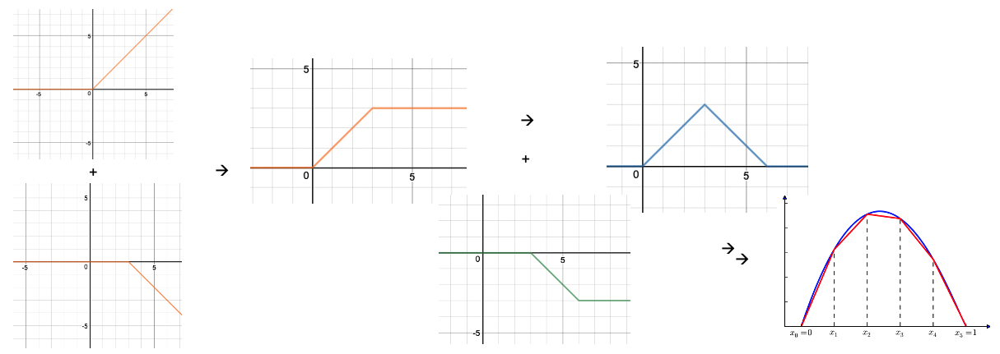

In [ ]:
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/expresive.jpg?raw=true'), width=1000)

But suffers from the curse of dimension (CoD)!

Approximate a function using piecewise linear functions over a mesh of size ℎ:
*   Let 𝑑 = dimension of the problem
*   Let 𝑚 = total number of parameters

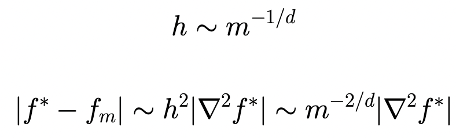

In [ ]:
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/CoD.png?raw=true'), width=500)

To reduce the error by a factor of 10, we need to increase 𝑚 by a factor of 10^(𝑑/2)

Dimension of Iris (left) vs. CIFAR-10 (right)

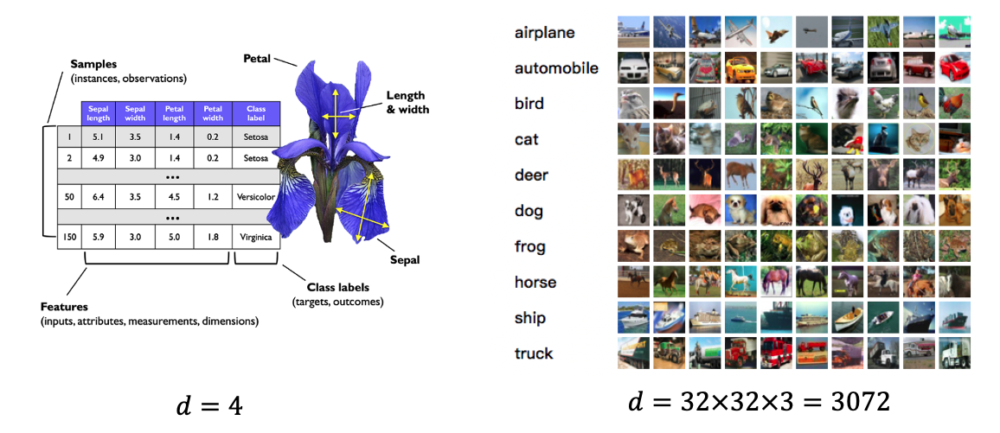

In [ ]:
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/dimension.jpg?raw=true'), width=1000)

Stronger expressive power brought by iteration, validated by empirical performance.

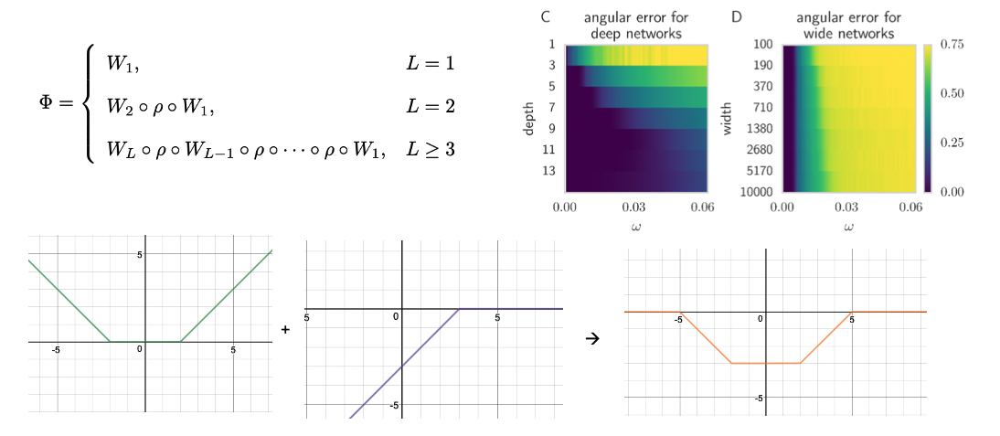

In [ ]:
# Source: Elbrächter, D., Perekrestenko, D., Grohs, P., & Bölcskei, H. (2021). IEEE Transactions on Information Theory, 67(5), 2581-2623.
# Source: Poole, B., Lahiri, S., Raghu, M., Sohl-Dickstein, J., & Ganguli, S. (2016). Advances in neural information processing systems, 29.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/stack.jpg?raw=true'), width=1000)

## Why Neural Network: flexible enough for end-to-end differentiable learning and add geometric prior

Hinton (2006) proposed to use NN to extract feature.

Hinton, G. E., & Salakhutdinov, R. R. (2006). Reducing the dimensionality of data with neural networks. science, 313(5786), 504-507.

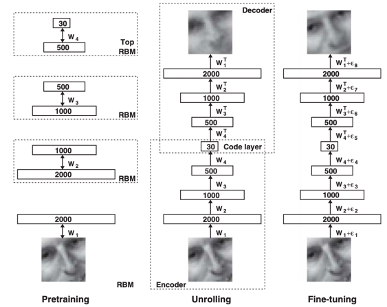

In [ ]:
# Source: Hinton, G. E., & Salakhutdinov, R. R. (2006). Reducing the dimensionality of data with neural networks. science, 313(5786), 504-507.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/hinton1.png?raw=true'), width=500)

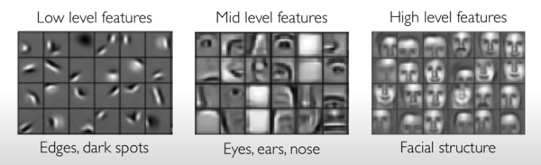

In [ ]:
# Source: https://www.knime.com/blog/convolutional-neural-networks-computer-vision
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/hinton2.png?raw=true'), width=700)

Later becomes end-to-end learning manner:

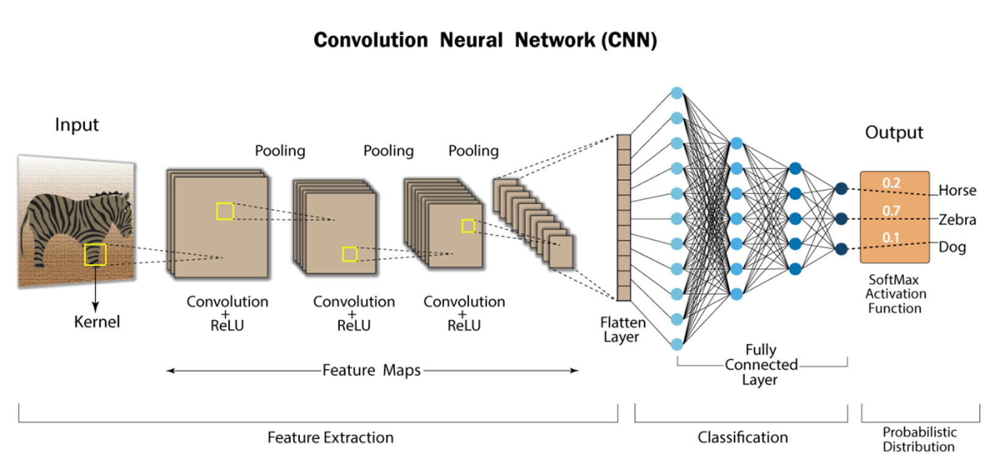

In [ ]:
# Source: https://developersbreach.com/convolution-neural-network-deep-learning/
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/cnn_e2e.png?raw=true'), width=1000)

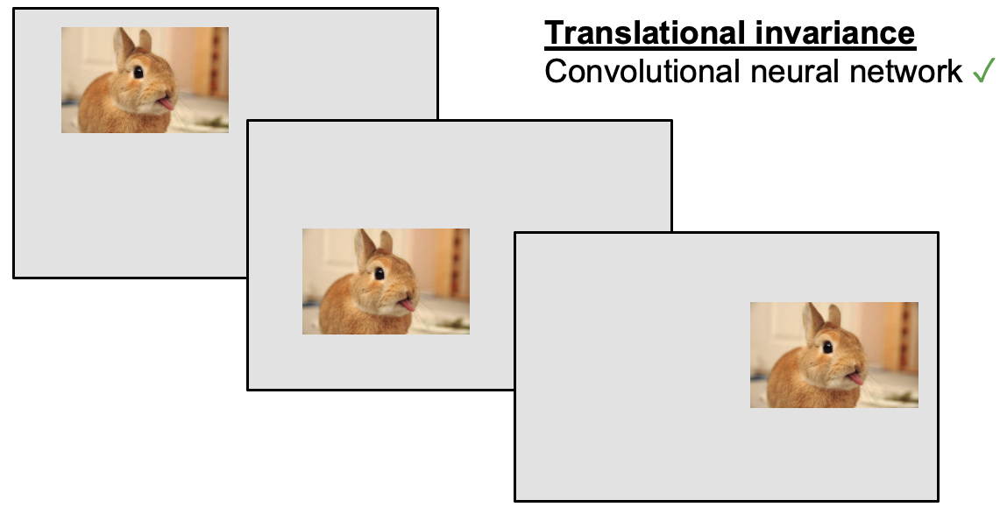

In [ ]:
# Source: https://e3nn.org
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/geometric_prior.jpg?raw=true'), width=1000)

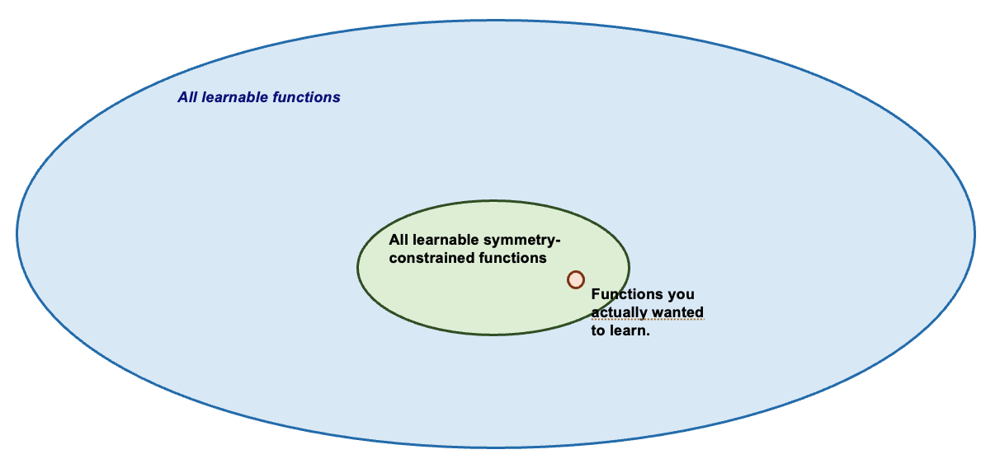

In [ ]:
# Source: https://e3nn.org
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/symmetry.jpg?raw=true'), width=1000)

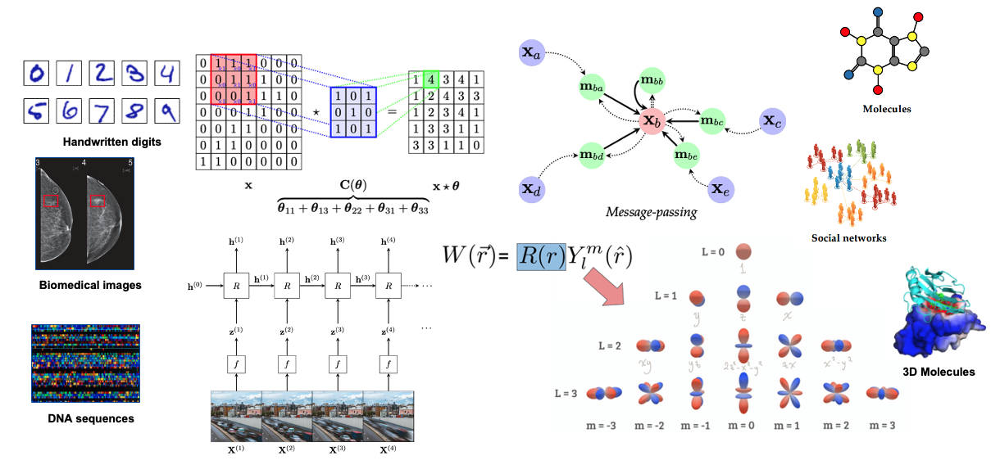

In [ ]:
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/various.jpg?raw=true'), width=1000)

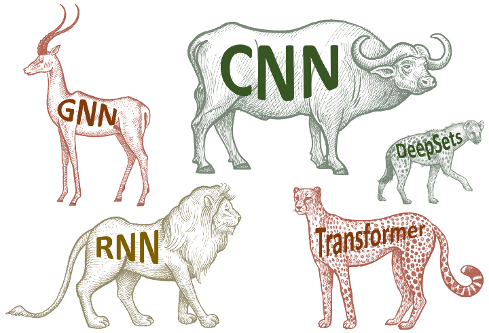

In [ ]:
# Source: Bronstein, M. M., Bruna, J., Cohen, T., & Veličković, P. (2021). arXiv preprint arXiv:2104.13478.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/zoo.png?raw=true'), width=500)

## More interesting observations

Deep double descent:

Source: Nakkiran, Preetum, et al. "Deep double descent: Where bigger models and more data hurt." Journal of Statistical Mechanics: Theory and Experiment 2021.12 (2021): 124003.

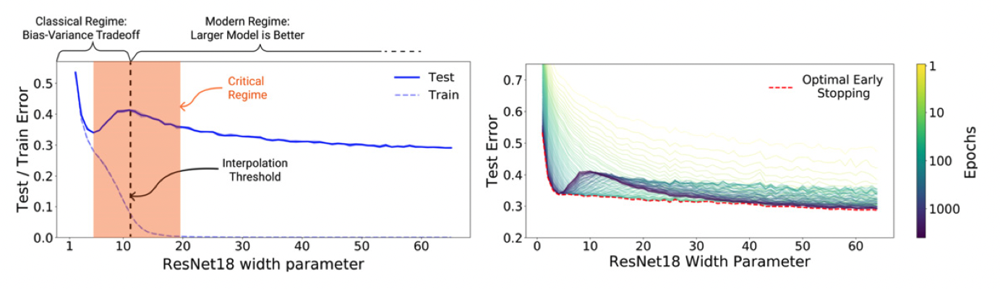

Grokking:

Source: Power, Alethea, et al. "Grokking: Generalization beyond overfitting on small algorithmic datasets." arXiv preprint arXiv:2201.02177 (2022).

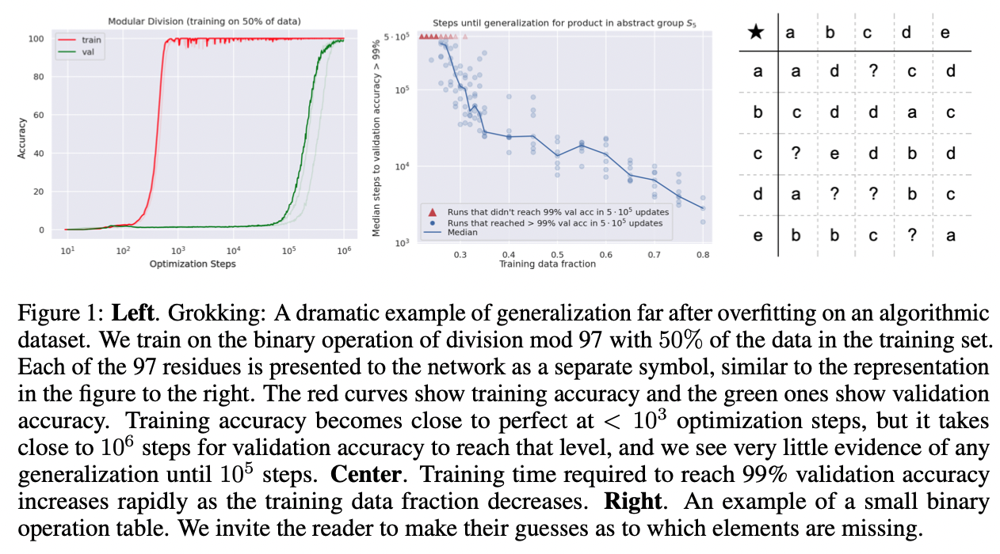

# **Predictive modeling with deep learning based on SMILES representation**

Note: The code in this section mostly adopt from https://github.com/john-bradshaw/ml-in-bioinformatics-summer-school-2020





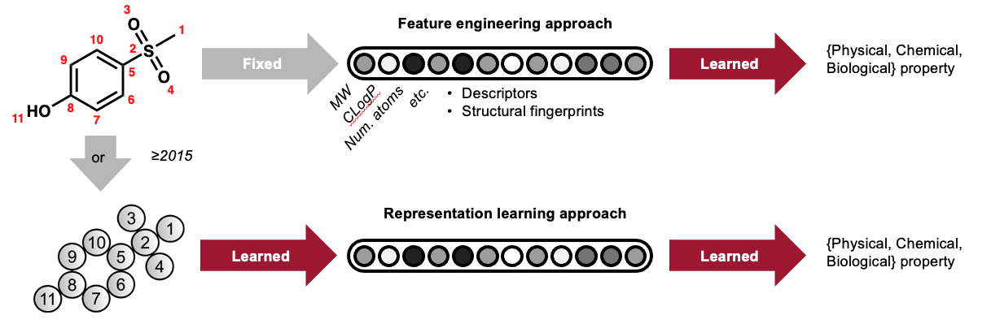

In [ ]:
# Source: Yang, Kevin, et al. "Analyzing learned molecular representations for property prediction." Journal of chemical information and modeling 59.8 (2019): 3370-3388.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/learned_representation.jpg?raw=true'), width=1000)

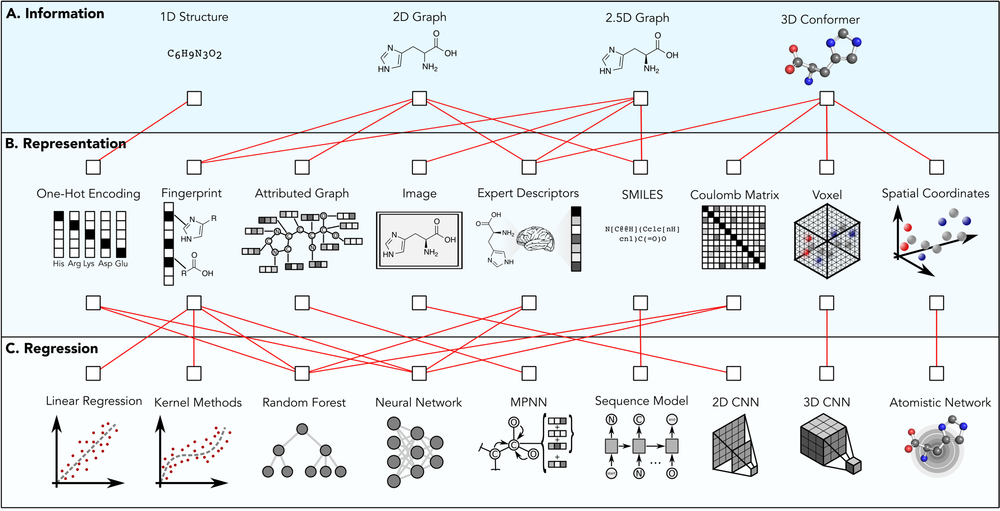

In [ ]:
# Source: Pattanaik and Coley, Chem 2020
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/mol_representation.png?raw=true'), width=1000)

Simplified molecular-input line-entry system (SMILES) representation of molecules.

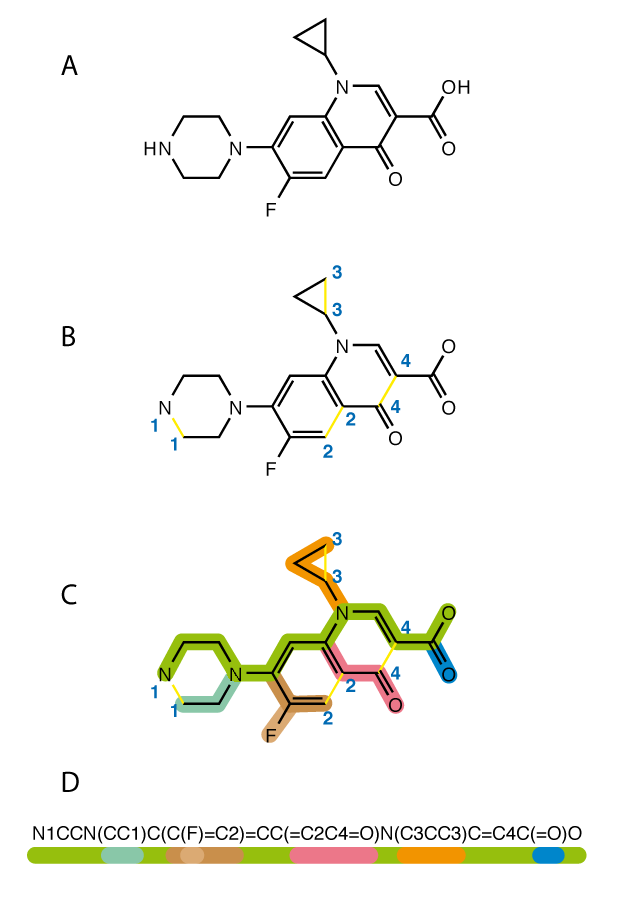

In [ ]:
# Source: https://en.wikipedia.org/wiki/Simplified_molecular-input_line-entry_system
Image(filename=wget.download('https://upload.wikimedia.org/wikipedia/commons/0/00/SMILES.png'), width=500)

In [ ]:
# Compute the node feature list
class SymbolFeaturizer:
    """
    Symbol featurizer takes in a symbol and returns an array representing its
    one-hot encoding.
    """
    def __init__(self, symbols, feature_size=None):
        self.atm2indx = {k:i for i, k in enumerate(symbols)}
        self.indx2atm = {v:k for k,v in self.atm2indx.items()}
        self.feature_size = feature_size if feature_size is not None else len(symbols)

    def __call__(self, atom_symbol):
        out = np.zeros(self.feature_size)
        out[self.atm2indx[atom_symbol]] = 1.
        return out

# This will calculate the maximum SMILES string size in our data, which is the
# same as the length we should ensure all tensors are padded to so that they can
# be batched:
max_seq_size = data_all['Drug'].map(len).max()

# This will calculate all the possible symbols in the smiles string:
symbols_in_smiles = set(itertools.chain(*data_all['Drug'].tolist()))
symbols_in_smiles = sorted(list(symbols_in_smiles))

# ...which we can then use to create a symbol featurizer
symbol_featurizer = SymbolFeaturizer(symbols_in_smiles)

In [ ]:
class TransformSeqModel:
    def __init__(self, symbol_featurizer, max_seq_size):
        self.symbol_featurizer = symbol_featurizer
        self.max_seq_size = max_seq_size

    def __call__(self, smiles: str) -> torch.Tensor:
        """
        Transforms SMILES strings into one-hot encodings of each symbol present.

        :returns: a tensor (dtype=torch.float32) of size
        [max_seq_size, one_hot_encoding_size]
        """
        one_hot_encodings = [self.symbol_featurizer(e) for e in smiles]
        one_hot_encodings = torch.tensor(one_hot_encodings, dtype=torch.float32)
        one_hot_encodings = F.pad(one_hot_encodings, (0,0,0, self.max_seq_size - one_hot_encodings.shape[0]))
        return one_hot_encodings


transform_seq_model = TransformSeqModel(symbol_featurizer, max_seq_size)

In [ ]:
# You can check the function is correct by eyeballing the output for acetaldehyde
# (alternatively you could write a function that converts back to SMILES to check for you)
torch.nonzero(transform_seq_model("CC=O"))

tensor([[ 0, 20],
        [ 1, 20],
        [ 2, 16],
        [ 3, 30]])

In [ ]:
# Define a RNN model (GRU)
class RNNModel(nn.Module):
    def __init__(self, symbol_vocab_size: int):
        """
        :param symbol_vocab_size: the dimension of the one-hot vectors, ie how many symbols we have
        in total (and also the initial channel size being fed into the RNN.)
        """
        super().__init__()
        h_size = 128
        self.rnn = nn.GRU(input_size=symbol_vocab_size, hidden_size=h_size, num_layers=2,
                          batch_first=True, bias=True)
        # ^ nb you could use a bidirectional one if you wanted, more layers etc...
        self.lin = nn.Linear(h_size, 1)

    def forward(self, x):
        """
        :param x: tensor [batch_size, seq_size, symbol_vocab_size]
        :returns: tensor [batch_size, 1]
        """
        _, out = self.rnn(x)  # out = [num_layers, batch_size, hidden_size]
        out = out[-1]  # [batch_size, hidden_size]
        out = self.lin(out)  # [batch_size, 1]
        return out

In [ ]:
rnn_model = RNNModel(len(symbols_in_smiles))
# We can check this model works by running it forward on two acetaldehydes batched up:
# (this should produce a two element column vector)
rnn_model(torch.stack([transform_seq_model("CC=O"), transform_seq_model("CC=O")]))

tensor([[0.0628],
        [0.0628]], grad_fn=<AddmmBackward0>)

In [ ]:
# Train and evaluate
out = utils.train_neural_network(data_train, data_test, "Drug", "Y", transform_seq_model, rnn_model)
display(HTML(tabulate.tabulate(out['out_table'], tablefmt="html")))

Train dataset is of size 7986 and valid of size 1996
Epoch - 0
Training Results - Epoch: 0  Avg loss: 3.00
Validation Results - Epoch: 0 Avg loss: 3.02


[1/125]   1%|           [00:00<?]

ERROR:ignite.engine.engine.Engine:Engine run is terminating due to exception: 


KeyboardInterrupt: 

In [ ]:
# plot learning curve
plt.figure(figsize=(6, 6))
plt.plot(out['train_loss_list'], label='train')
plt.plot(out['val_lost_list'], label='val')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
class CNNModel(nn.Module):
    def __init__(self, symbol_vocab_size: int, seq_len:int):
        """
        :param symbol_vocab_size: the size of the one hot vectors (also the initial channel size for the CNN)
        :param seq_len: the size of all sequences.
        """
        super().__init__()

        # conv params
        self.channel_size_after_conv = 128
        kernel_size = 3

        # convolution:
        self.cnn = nn.Conv1d(in_channels=symbol_vocab_size,
                             out_channels=self.channel_size_after_conv,
                             kernel_size=kernel_size)
        out_size_after_conv = seq_len - kernel_size + 1
        # ^ computed using the formula on https://pytorch.org/docs/stable/generated/torch.nn.Conv1d.html
        # note this will change if you use padding, dilation, etc...

        # we will pool across all of sequence:
        self.pool = nn.AvgPool1d(kernel_size=out_size_after_conv)

        self.lin = nn.Linear(self.channel_size_after_conv, 1)

    def forward(self, x):
        """
        :param x: tensor [batch_size, seq_size, symbol_vocab_size (channel dim)]
        :returns: tensor [batch_size, 1]
        """
        batch_size, *_ = x.shape
        x = x.permute(0, 2, 1)  # [batch_size, symbol_vocab_size, seq_size]
        out = self.cnn(x)  # [batch_size, C_out, L_out]
        out = self.pool(out)  # [batch_size, C_out, 1]
        out = out.view(batch_size, self.channel_size_after_conv) #  [batch_size, C_out]
        out = self.lin(out)
        return out

In [ ]:
cnn_model = CNNModel(len(symbols_in_smiles), max_seq_size)
out = utils.train_neural_network(data_train, data_test, "Drug", "Y", transform_seq_model, rnn_model)
display(HTML(tabulate.tabulate(out['out_table'], tablefmt="html")))

In [ ]:
# plot learning curve
plt.figure(figsize=(6, 6))
plt.plot(out['train_loss_list'], label='train')
plt.plot(out['val_lost_list'], label='val')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **Predictive modeling with deep learning based on graph representation**

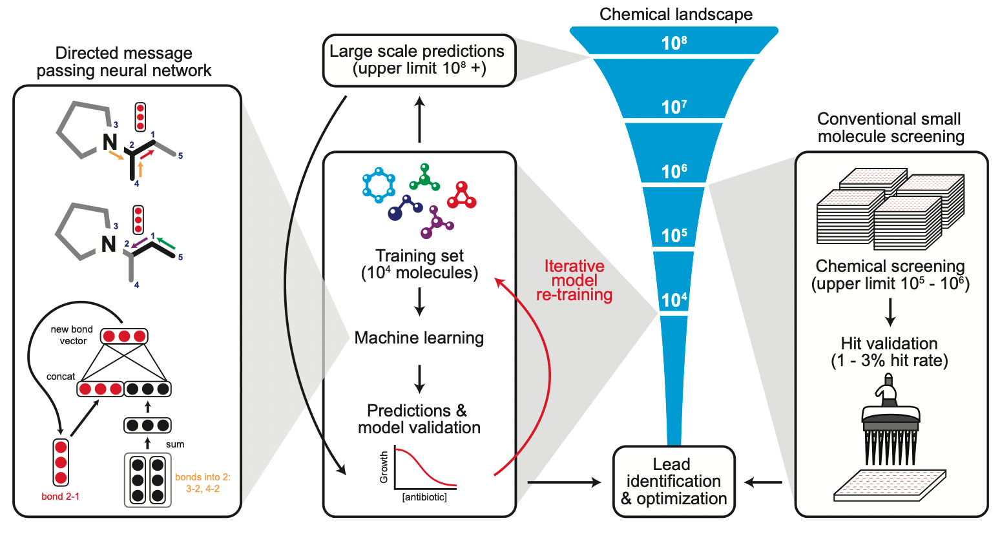

In [ ]:
# Source: Stokes, Jonathan M., et al. "A deep learning approach to antibiotic discovery." Cell 180.4 (2020): 688-702.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/cell.jpg?raw=true'), width=1000)

## Demonstration with PyG

In [ ]:
######################################################################################################################################################
########################### taken from https://github.com/chemprop/chemprop/blob/master/chemprop/features/featurization.py ###########################
######################################################################################################################################################

class Featurization_parameters:
    """
    A class holding molecule featurization parameters as attributes.
    """
    def __init__(self) -> None:

        # Atom feature sizes
        self.MAX_ATOMIC_NUM = 100
        self.ATOM_FEATURES = {
            'atomic_num': list(range(self.MAX_ATOMIC_NUM)),
            'degree': [0, 1, 2, 3, 4, 5],
            'formal_charge': [-1, -2, 1, 2, 0],
            'chiral_tag': [0, 1, 2, 3],
            'num_Hs': [0, 1, 2, 3, 4],
            'hybridization': [
                Chem.rdchem.HybridizationType.SP,
                Chem.rdchem.HybridizationType.SP2,
                Chem.rdchem.HybridizationType.SP3,
                Chem.rdchem.HybridizationType.SP3D,
                Chem.rdchem.HybridizationType.SP3D2
            ],
        }

        # Distance feature sizes
        self.PATH_DISTANCE_BINS = list(range(10))
        self.THREE_D_DISTANCE_MAX = 20
        self.THREE_D_DISTANCE_STEP = 1
        self.THREE_D_DISTANCE_BINS = list(range(0, self.THREE_D_DISTANCE_MAX + 1, self.THREE_D_DISTANCE_STEP))

        # len(choices) + 1 to include room for uncommon values; + 2 at end for IsAromatic and mass
        self.ATOM_FDIM = sum(len(choices) + 1 for choices in self.ATOM_FEATURES.values()) + 2
        self.EXTRA_ATOM_FDIM = 0
        self.BOND_FDIM = 14
        self.EXTRA_BOND_FDIM = 0
        self.REACTION_MODE = None
        self.EXPLICIT_H = False
        self.REACTION = False
        self.ADDING_H = False
        self.KEEP_ATOM_MAP = False

# Create a global parameter object for reference throughout this module
PARAMS = Featurization_parameters()

def onek_encoding_unk(value: int, choices: List[int]) -> List[int]:
    """
    Creates a one-hot encoding with an extra category for uncommon values.
    :param value: The value for which the encoding should be one.
    :param choices: A list of possible values.
    :return: A one-hot encoding of the :code:`value` in a list of length :code:`len(choices) + 1`.
             If :code:`value` is not in :code:`choices`, then the final element in the encoding is 1.
    """
    encoding = [0] * (len(choices) + 1)
    index = choices.index(value) if value in choices else -1
    encoding[index] = 1

    return encoding

In [ ]:
def atom_features(atom: Chem.rdchem.Atom, functional_groups: List[int] = None) -> List[Union[bool, int, float]]:
    """
    Builds a feature vector for an atom.
    :param atom: An RDKit atom.
    :param functional_groups: A k-hot vector indicating the functional groups the atom belongs to.
    :return: A list containing the atom features.
    """
    if atom is None:
        features = [0] * PARAMS.ATOM_FDIM
    else:
        features = onek_encoding_unk(atom.GetAtomicNum() - 1, PARAMS.ATOM_FEATURES['atomic_num']) + \
            onek_encoding_unk(atom.GetTotalDegree(), PARAMS.ATOM_FEATURES['degree']) + \
            onek_encoding_unk(atom.GetFormalCharge(), PARAMS.ATOM_FEATURES['formal_charge']) + \
            onek_encoding_unk(int(atom.GetChiralTag()), PARAMS.ATOM_FEATURES['chiral_tag']) + \
            onek_encoding_unk(int(atom.GetTotalNumHs()), PARAMS.ATOM_FEATURES['num_Hs']) + \
            onek_encoding_unk(int(atom.GetHybridization()), PARAMS.ATOM_FEATURES['hybridization']) + \
            [1 if atom.GetIsAromatic() else 0] + \
            [atom.GetMass() * 0.01]  # scaled to about the same range as other features
        if functional_groups is not None:
            features += functional_groups
    return features

atom_features(Chem.MolFromSmiles("CC=O").GetAtoms()[0])

[0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0.12011]

In [ ]:
def bond_features(bond: Chem.rdchem.Bond) -> List[Union[bool, int, float]]:
    """
    Builds a feature vector for a bond.
    :param bond: An RDKit bond.
    :return: A list containing the bond features.
    """
    if bond is None:
        fbond = [1] + [0] * (PARAMS.BOND_FDIM - 1)
    else:
        bt = bond.GetBondType()
        fbond = [
            0,  # bond is not None
            bt == Chem.rdchem.BondType.SINGLE,
            bt == Chem.rdchem.BondType.DOUBLE,
            bt == Chem.rdchem.BondType.TRIPLE,
            bt == Chem.rdchem.BondType.AROMATIC,
            (bond.GetIsConjugated() if bt is not None else 0),
            (bond.IsInRing() if bt is not None else 0)
        ]
        fbond += onek_encoding_unk(int(bond.GetStereo()), list(range(6)))
    return fbond

bond_features(Chem.MolFromSmiles("CC=O").GetBonds()[0])

[0, True, False, False, False, False, False, 1, 0, 0, 0, 0, 0, 0]

In [ ]:
######################################################################################################################################################
#################### modified from https://pytorch-geometric.readthedocs.io/en/latest/_modules/torch_geometric/utils/smiles.html #####################
######################################################################################################################################################

def smiles_to_graph(smiles: str, y: float, atm_idx=None, with_hydrogen: bool = False, kekulize: bool = False) -> 'torch.geometric.data.Data':
    """
    Converts a SMILES string to a :class:`torch_geometric.data.Data`
    instance.

    Args:
        smiles (str): The SMILES string.
        with_hydrogen (bool, optional): If set to :obj:`True`, will store
            hydrogens in the molecule graph. (default: :obj:`False`)
        kekulize (bool, optional): If set to :obj:`True`, converts aromatic
        bonds to single/double bonds. (default: :obj:`False`)
    """
    RDLogger.DisableLog('rdApp.*')

    mol = Chem.MolFromSmiles(smiles)

    if mol is None:
        mol = Chem.MolFromSmiles('')
    if with_hydrogen:
        mol = Chem.AddHs(mol)
    if kekulize:
        Chem.Kekulize(mol)

    xs = []
    for atom in mol.GetAtoms():
        xs.append(atom_features(atom))

    x = torch.tensor(xs, dtype=torch.long) #.view(-1, 9)

    edge_indices, edge_attrs = [], []
    for bond in mol.GetBonds():
        i = bond.GetBeginAtomIdx()
        j = bond.GetEndAtomIdx()

        e = []
        e.append(bond_features(bond))
        edge_indices += [[i, j], [j, i]]
        edge_attrs += [e, e]

    edge_index = torch.tensor(edge_indices)
    edge_index = edge_index.t().to(torch.long).view(2, -1)
    edge_attr = torch.tensor(edge_attrs, dtype=torch.long) # .view(-1, 3)

    if edge_index.numel() > 0:  # Sort indices.
        perm = (edge_index[0] * x.size(0) + edge_index[1]).argsort()
        edge_index, edge_attr = edge_index[:, perm], edge_attr[perm]

    if atm_idx is not None:
        return Data(x=x, edge_index=edge_index, edge_attr=torch.squeeze(edge_attr), y=torch.tensor([y], dtype=torch.float32), atm_idx=torch.tensor([atm_idx]))
    else:
        return Data(x=x, edge_index=edge_index, edge_attr=torch.squeeze(edge_attr), y=torch.tensor([y], dtype=torch.float32))

graph_temp = smiles_to_graph(smiles="CC=O", y=0.1)
print(graph_temp)
graph_temp.x, graph_temp.edge_index, graph_temp.edge_attr, graph_temp.y

Data(x=[3, 133], edge_index=[2, 4], edge_attr=[4, 14], y=[1])


(tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
          0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
          1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

GNNs use the graph structure and node features $X_v$ to learn a representa- tion vector of a node, $h_v$, or the entire graph, $h_G$. Modern GNNs follow a neighborhood aggregation strategy, where we iteratively update the representation of a node by aggregating representations of its neighbors. After $k$ iterations of aggregation, a node's representation captures the structural information within its k-hop network neighborhood.

Source: Xu, Keyulu, et al. "How powerful are graph neural networks?." arXiv preprint arXiv:1810.00826 (2018).

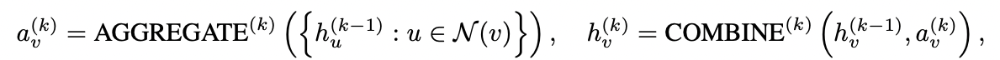

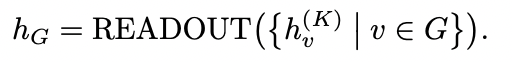

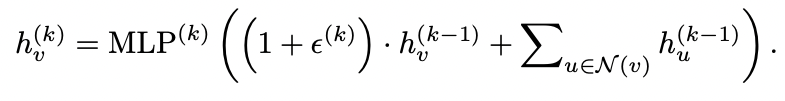

In [ ]:
from torch_geometric.nn import MLP, GINConv, global_add_pool

class GIN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, num_layers):
        super().__init__()

        self.convs = torch.nn.ModuleList()
        for _ in range(num_layers):
            mlp = MLP([in_channels, hidden_channels, hidden_channels])
            self.convs.append(GINConv(nn=mlp, train_eps=False))
            in_channels = hidden_channels

        self.mlp = MLP([hidden_channels, hidden_channels, out_channels],
                       norm=None, dropout=0.5)

    def forward(self, *argv):
        if len(argv) == 3:
            x, edge_index, batch = argv[0], argv[1], argv[2]
        elif len(argv) == 1:
            data = argv[0]
            x, edge_index, batch = data.x, data.edge_index, data.batch
        else:
            raise ValueError("unmatched number of arguments.")

        for conv in self.convs:
            x = conv(x, edge_index).relu()
        x = global_add_pool(x, batch)
        return self.mlp(x)

gin = GIN(in_channels=133, hidden_channels=64, out_channels=1, num_layers=3)
graph_temp.batch = torch.tensor([0, 0, 0], dtype=torch.long)
gin(graph_temp)

tensor([[0.0120]], grad_fn=<AddmmBackward0>)

In [ ]:
# Takes about 1.5 min

from torch_geometric.loader import DataLoader

batch_size = 128
epochs = 40
hidden_channels = 64
num_layers = 5
lr = 0.001

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_dataset = [smiles_to_graph(smiles=data_train['Drug'][ind], y=data_train['Y'][ind]) for ind in range(len(data_train))]
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)

test_dataset = [smiles_to_graph(smiles=data_test['Drug'][ind], y=data_test['Y'][ind]) for ind in range(len(data_test))]
test_loader = DataLoader(test_dataset, batch_size)

gin = GIN(in_channels=133, hidden_channels=hidden_channels, out_channels=1, num_layers=num_layers).to(device)
optimizer = torch.optim.Adam(gin.parameters(), lr=lr)

train_loss_list = []
val_lost_list = []

for epcoh in range(1, epochs + 1):
        # Train
        gin.train()
        for data_minibatch in train_loader:
                data_minibatch = data_minibatch.to(device)
                optimizer.zero_grad()
                out = gin(data_minibatch)
                loss = F.l1_loss(out, data_minibatch.y)
                loss.backward()
                optimizer.step()

        # Evaluate on training set
        gin.eval()
        total_loss_train = 0
        for data_minibatch in train_loader:
                data_minibatch = data_minibatch.to(device)
                pred = gin(data_minibatch)
                loss = F.l1_loss(pred, data_minibatch.y)
                total_loss_train += float(loss) * data_minibatch.num_graphs

        # Evaluate on test set
        gin.eval()
        total_loss_test = 0
        for data_minibatch in test_loader:
                data_minibatch = data_minibatch.to(device)
                pred = gin(data_minibatch)
                loss = F.l1_loss(pred, data_minibatch.y)
                total_loss_test += float(loss) * data_minibatch.num_graphs

        total_loss_train /= len(train_dataset)
        total_loss_test /= len(test_dataset)

        train_loss_list.append(total_loss_train)
        val_lost_list.append(total_loss_test)

        print(f'Epoch: {epcoh:03d}, Train MAE: {total_loss_train:.4f}, Test MAE: {total_loss_test:.4f}')

Epoch: 001, Train MAE: 2.0573, Test MAE: 2.0597
Epoch: 002, Train MAE: 2.0159, Test MAE: 2.0218
Epoch: 003, Train MAE: 2.0710, Test MAE: 2.0810
Epoch: 004, Train MAE: 1.9913, Test MAE: 2.0004
Epoch: 005, Train MAE: 1.9689, Test MAE: 1.9723
Epoch: 006, Train MAE: 2.0216, Test MAE: 2.0254
Epoch: 007, Train MAE: 1.9373, Test MAE: 1.9394


KeyboardInterrupt: 

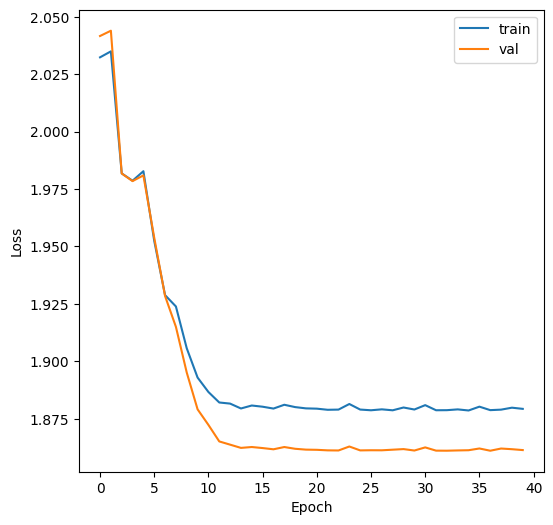

In [ ]:
# Plot learning curve
plt.figure(figsize=(6, 6))
plt.plot(train_loss_list, label='train')
plt.plot(val_lost_list, label='val')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

There are many flavors of GNN, PyG provide a nice start point to explore them: [link](https://pytorch-geometric.readthedocs.io/en/latest/cheatsheet/gnn_cheatsheet.html)

Also a nice collection of tutorials: [link](https://medium.com/stanford-cs224w)

## Chemprop -- A neat way of D-MPNN

In [ ]:
# data_train.to_csv('./data_train.csv', index=False)
# data_test.to_csv('./data_test.csv', index=False)

wget.download('https://raw.githubusercontent.com/wenhao-gao/24IAP_ml4moldesign/main/P3/data_train.csv')
wget.download('https://raw.githubusercontent.com/wenhao-gao/24IAP_ml4moldesign/main/P3/data_test.csv')

'data_test.csv'

In [ ]:
# Takes about 5.5 min

import chemprop

arguments = [
    '--data_path', "./data_train.csv",
    '--separate_test_path', "./data_test.csv",
    '--num_folds', '1',
    '--epochs','30',
    '--ensemble_size','1',
    '--extra_metrics','mae',
    '--ignore_columns', 'Drug_ID',
    '--smiles_columns','Drug',
    '--quiet',
    '--dataset_type', 'regression',
    '--save_dir', "./chemprop_results",
    '--save_preds'
]
args = chemprop.args.TrainArgs().parse_args(arguments)
mean_score, std_score = chemprop.train.cross_validate(args=args, train_func=chemprop.train.run_training)

7986it [00:00, 160333.30it/s]
100%|██████████| 7986/7986 [00:02<00:00, 3157.40it/s]
Fold 0
1996it [00:00, 96514.15it/s]
100%|██████████| 128/128 [00:28<00:00,  3.97it/s]
                                                 
100%|██████████| 128/128 [00:21<00:00,  4.74it/s]
                                                 
100%|██████████| 128/128 [00:20<00:00,  7.27it/s]
                                                 
100%|██████████| 128/128 [00:21<00:00,  7.10it/s]
                                                 
100%|██████████| 128/128 [00:22<00:00,  6.64it/s]
                                                 
100%|██████████| 128/128 [00:22<00:00,  7.15it/s]
                                                 
100%|██████████| 128/128 [00:22<00:00,  4.48it/s]
                                                 
100%|██████████| 128/128 [00:21<00:00,  5.92it/s]
                                                 
100%|██████████| 128/128 [00:22<00:00,  6.54it/s]
                              

## End of Story?

Note that the random forest model we used are not engineered. In fact, in a latest antibiotic discovery paper, there are some interesting results:

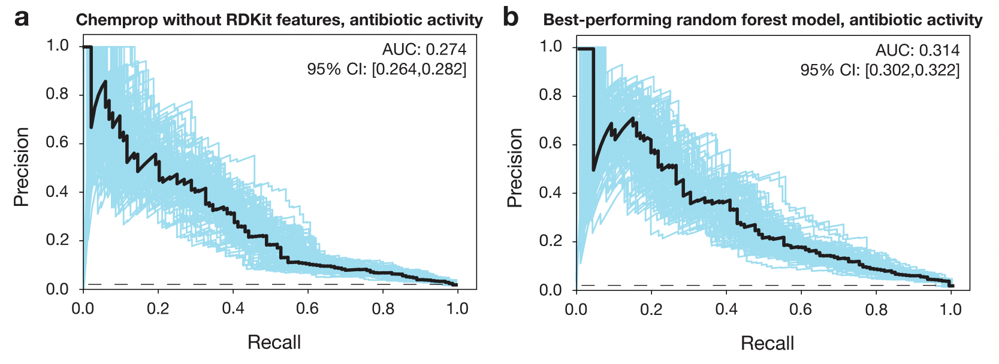

In [ ]:
# Source: Wong, Felix, et al. "Discovery of a structural class of antibiotics with explainable deep learning." Nature (2023): 1-9.
Image(filename=wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/blob/main/P3/tricky.jpg?raw=true'), width=1000)

If we check the benchmarks: [TDC](https://tdcommons.ai/benchmark/admet_group/overview/), [OGB](https://ogb.stanford.edu/docs/leader_graphprop/), a lot of top-ranked models are not DL.

The current situation is that the deep learning in molecular science has not yet reached the level of sophistication and effectiveness seen in CV or NLP.

To get a practically good performance, you also need good engineering, which includes but not limited to:

*   Feature engineering
*   Hyper-parameter tuning
*   Ensemble or boosting
*   Data augmentation
*   Numerous trainnig tricks


# **Next**

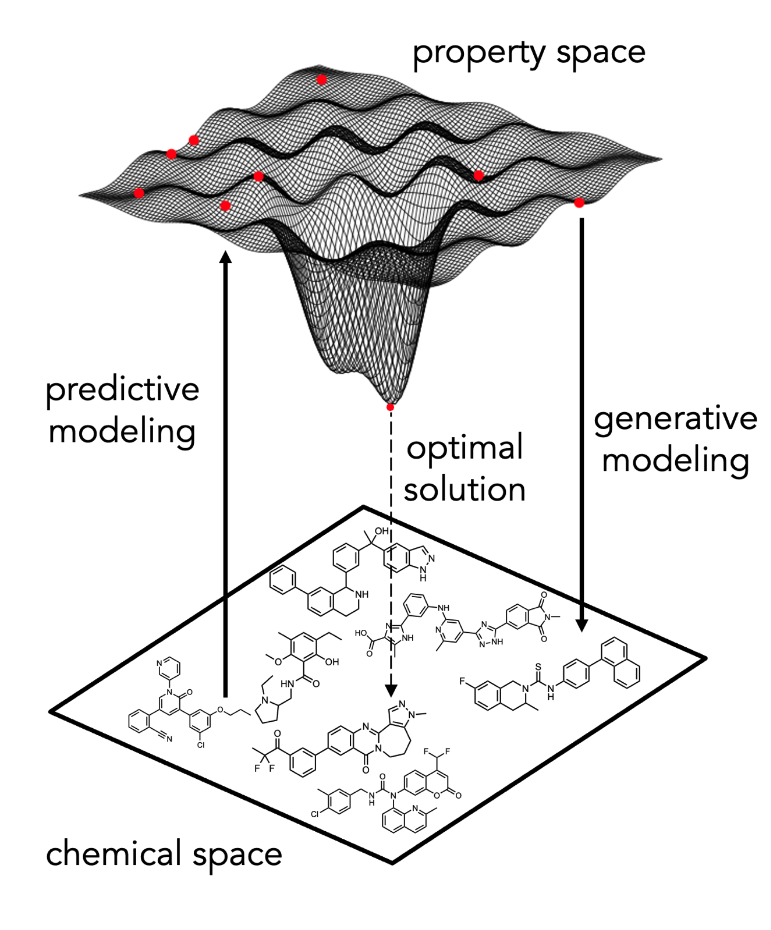

# **Practice**

Optional:
1.   Try implement another flavor of GNN (practice PyG)
2.   Try apply chemprop on the project dataset (practice chemprop)

